In [1]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path
import multiprocessing
from scipy.spatial.distance import cdist
import yaml
from datetime import datetime

import math
import numpy as np
from cv2 import Rodrigues
from math import sin, cos, atan2, sqrt
import pandas as pd
from pathlib import Path
import pyproj
from pyproj import Proj, transform

In [2]:
def init_logger(log_file='logger.log'):
    from logging import getLogger, INFO, FileHandler,  Formatter,  StreamHandler
    logger = getLogger(__name__)
    logger.setLevel(INFO)
    handler1 = StreamHandler()
    handler1.setFormatter(Formatter("%(message)s"))
    handler2 = FileHandler(filename=log_file)
    handler2.setFormatter(Formatter("%(message)s"))
    logger.addHandler(handler1)
    logger.addHandler(handler2)
    return logger
    
today = datetime.now().strftime('%Y-%m-%d')
logger = init_logger(log_file=f'./{today}.log')
logger.info('Start Logging...')

Start Logging...


In [3]:
def seed_everything(seed: int):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)

In [4]:
# config
with open('config.yaml') as f:
    config = yaml.safe_load(f)

# globals variable
SEED = config['globals']['seed']
N_SPLITS = config['globals']['n_splits']
USE_FOLDS = config['globals']['use_folds']
DEBUG = config['globals']['debug']
EXP_MESSAGE = config['globals']['exp_message']
NOTES = config['globals']['notes']
EXP_NAME = str(Path().resolve()).split('/')[-1]

In [9]:
# waypointを補正したdataset
root_dir = Path('../../input')
data_dir = root_dir/'google-smartphone-decimeter-challenge'
collection_type_dict = from_pickle(root_dir/"road_type.pkl") # by edge'sdegree and highway feature
collection_type_dict["test"]['2021-03-25-US-PAO-1'] = "normal"

In [5]:
import pickle
def to_pickle(filename, obj):
    with open(filename, mode='wb') as f:
        pickle.dump(obj, f)
        
def from_pickle(filename):
    with open(filename, mode='rb') as f:
        obj = pickle.load(f)
    return obj

In [6]:
def get_ground_truth(args):
    (collectionName, phoneName), df = args
    
    path = root_dir / f"train/{collectionName}/{phoneName}/ground_truth.csv"
    target_df = pd.read_csv(path)
    output_df = pd.DataFrame()
    # merge derived and target by 'millisSinceGpsEpoch'
    for epoch, epoch_df in df.groupby('millisSinceGpsEpoch'):
        idx = (target_df['millisSinceGpsEpoch'] - epoch).abs().argmin()
        epoch_diff = epoch - target_df.loc[idx, 'millisSinceGpsEpoch']
        epoch_df['epoch_diff'] = epoch_diff
        epoch_df['target_latDeg'] = target_df.loc[idx, 'latDeg']
        epoch_df['target_lngDeg'] = target_df.loc[idx, 'lngDeg']
        epoch_df['speedMps'] = target_df.loc[idx, 'speedMps']
        output_df = pd.concat([output_df, epoch_df]).reset_index(drop=True)    
    return output_df

In [7]:
import plotly.express as px

def visualize_trafic(df):
    fig = px.scatter_mapbox(df,
                            
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            text='phoneName',
                            
                            #Here, plotly detects color of series
                            color="collectionName",
                            labels="collectionName",
                            
                            zoom=9,
                            center={"lat":37.423576, "lon":-122.094132},
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()


def visualize_collection(df, root_dir, collection_name='2021-04-29-US-SJC-2'):
    gt_df = pd.read_csv(root_dir / 'all_ground_truth.csv')
    gt_df['phoneName'] = 'ground truth'
    gt_df = pd.concat([df, gt_df])
    target_df = gt_df[gt_df['collectionName']==collection_name]   
    target_df['elapsed_epoch'] = ((target_df['millisSinceGpsEpoch'] - target_df['millisSinceGpsEpoch'].min()) / 1000).astype(str).to_numpy()
    fig = px.scatter_mapbox(target_df,
                                
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            text='elapsed_epoch',
                                
                            #Here, plotly detects color of series
                            color="phoneName",
                            labels="phoneName",
                                
                            zoom=9,
                            center={"lat":37.423576, "lon":-122.094132},
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="{collection_name}")
    fig.show()

In [8]:
# metric
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

def check_score(input_df: pd.DataFrame) -> pd.DataFrame:
    if "phone" not in input_df.columns:
        input_df["phone"] = input_df["collectionName"] + "_" + input_df["phoneName"]

    if "target_latDeg" not in input_df.columns:
        processes = multiprocessing.cpu_count()
        with multiprocessing.Pool(processes=processes) as pool:
            gr = input_df.groupby(['collectionName','phoneName'])
            dfs = pool.imap_unordered(get_ground_truth, gr)
            dfs = tqdm(dfs, total=len(gr))
            dfs = list(dfs)
        input_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch']).reset_index(drop=True)     


    output_df = input_df.copy()
    
    output_df['error'] = input_df.apply(
        lambda r: calc_haversine(
            r.latDeg, r.lngDeg, r.target_latDeg, r.target_lngDeg
        ),
        axis=1
    )

    meter_score = output_df['error'].mean()
    print(f'mean error: {meter_score}')

    scores = []
    p_50_scores = []
    p_95_scores = []
    mean_scores = []
    phones = []
    score_df = pd.DataFrame()
    for phone in output_df['phone'].unique():
        _index = output_df['phone']==phone
        p_50 = np.percentile(output_df.loc[_index, 'error'], 50)
        p_95 = np.percentile(output_df.loc[_index, 'error'], 95)
        # print(f"{phone} | 50:{p_50:.5g}| 95:{p_95:.5g}")
        p_50_scores.append(p_50)
        p_95_scores.append(p_95)
        mean_scores.append(np.mean([p_50, p_95]))
        phones.append(phone)

        scores.append(p_50)
        scores.append(p_95)

    score_df["phone"] = phones
    score_df["p_50_score"] = p_50_scores
    score_df["p_95_score"] = p_95_scores
    score_df["mean_score"] = mean_scores
    
    comp_score = sum(scores) / len(scores)
    print(f"competition metric:{comp_score}")
    return output_df, score_df

In [10]:
def check_time(_df):
    data = _df.copy().reset_index(drop=True)
    data['ms_dif'] = data['millisSinceGpsEpoch']-data['millisSinceGpsEpoch'].shift()
    mis_time = (len(data)-1-data['ms_dif'].value_counts()[1000.0])/len(data)
    return mis_time>0.0

def adjust_time(df, kf):
    data = df.copy().reset_index(drop=True)
    new_data = data.copy()
    t = 'millisSinceGpsEpoch'
    start = data['millisSinceGpsEpoch'].values[0]
    end = data['millisSinceGpsEpoch'].values[-1]
    ind = math.ceil((end-start)/1000)
    _data = pd.DataFrame(index=range(ind))
    _data['latDeg']=0
    _data['lngDeg']=0
    #_data['millisSinceGpsEpoch'] = 0
    _data['millisSinceGpsEpoch'] = start+1000*_data.index
    
    cnt = 0
    for i in _data.index:
        while _data.loc[i,t]<new_data.loc[cnt,t] or _data.loc[i,t]>new_data.loc[cnt+1,t]:
            cnt+=1
        if _data.loc[i,t]==new_data.loc[cnt,t]:
            _data.loc[i,'latDeg'] = new_data.loc[cnt,'latDeg']
            _data.loc[i,'lngDeg'] = new_data.loc[cnt,'lngDeg']
        else:
            w=(new_data.loc[cnt+1,t]-_data.loc[i,t])/(new_data.loc[cnt+1,t]-new_data.loc[cnt,t])
            if w<0 or w>1:
                print(w)
            _data.loc[i,'latDeg'] = new_data.loc[cnt,'latDeg']*w+new_data.loc[cnt+1,'latDeg']*(1-w)
            _data.loc[i,'lngDeg'] = new_data.loc[cnt,'lngDeg']*w+new_data.loc[cnt+1,'lngDeg']*(1-w)
    _data.head()
    __data = _data.loc[:,['latDeg', 'lngDeg']].to_numpy()
    __data = __data.reshape(1, len(__data), 2)
    smoothed = kf.smooth(__data)
    _data.loc[:,'latDeg_pred'] = smoothed.states.mean[0, :, 0]
    _data.loc[:,'lngDeg_pred'] = smoothed.states.mean[0, :, 1]
    _data.loc[:,'latDeg_cov_pred'] = smoothed.states.cov[0, :, 0,0]
    _data.loc[:,'lngDeg_cov_pred'] = smoothed.states.cov[0, :, 1,1]
    data['latDeg_cov'] = 1
    data['lngDeg_cov'] = 1

    cnt = 0
    for i in data.index:
        try:
            while data.loc[i,t]<_data.loc[cnt,t] or data.loc[i,t]>_data.loc[cnt+1,t]:
                cnt+=1
            if data.loc[i,t]==_data.loc[cnt,t]:
                data.loc[i,'latDeg'] = _data.loc[cnt,'latDeg_pred']
                data.loc[i,'lngDeg'] = _data.loc[cnt,'lngDeg_pred']
                data.loc[i,'latDeg_cov'] = _data.loc[cnt,'latDeg_cov_pred']
                data.loc[i,'lngDeg_cov'] = _data.loc[cnt,'lngDeg_cov_pred']
            else:
                w=(_data.loc[cnt+1,t]-data.loc[i,t])/(_data.loc[cnt+1,t]-_data.loc[cnt,t])
                if w<0 or w>1:
                    print(w)
                data.loc[i,'latDeg'] = _data.loc[cnt,'latDeg_pred']*w+_data.loc[cnt+1,'latDeg_pred']*(1-w)
                data.loc[i,'lngDeg'] = _data.loc[cnt,'lngDeg_pred']*w+_data.loc[cnt+1,'lngDeg_pred']*(1-w)
                data.loc[i,'latDeg_cov'] = _data.loc[cnt,'latDeg_cov_pred']*w+_data.loc[cnt+1,'latDeg_cov_pred']*(1-w)
                data.loc[i,'lngDeg_cov'] = _data.loc[cnt,'lngDeg_cov_pred']*w+_data.loc[cnt+1,'lngDeg_cov_pred']*(1-w)
        except:
            pass
    return data

In [11]:
import simdkalman

def apply_kf_smoothing(input_df, phase="train"):
    logger.info('[START] Kalman Smoothing')
    # define kf model
    df_list = []
    for (collection_name,phone_name), df in input_df.groupby(["collectionName", "phoneName"]):
        df = df.sort_values("millisSinceGpsEpoch")
        if collection_type_dict[phase][collection_name] == "highway":
            # score: 2.8204355271575277 -> 2.8193315973589166
            # Best hyperparameters: {'T': 2.0, 'p_noise': 2.705460166533897e-07, 'o_noise': 1.3966292122575907e-09}
            # defaultを使用
            T = 1.0
            p_noise = 1e-9
            o_noise = 1e-9

            state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                                        [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
            process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * p_noise
            observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])    
            observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * o_noise

        elif collection_type_dict[phase][collection_name] == "normal":
            # score: 5.278659054251117 -> 5.213777593582035
            # Best hyperparameters: {'T': 0.9, 'p_noise': 1.0380420148601327e-12, 'o_noise': 6.122291790973238e-06}
            T = 0.9
            p_noise = 1e-12
            o_noise = 6.1e-6

            state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                                        [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
            process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * p_noise
            observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])    
            observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * o_noise
        else:
            # score: 18.002721439031802 -> 17.71027356807068
            # Best hyperparameters: {'T': 0.30000000000000004, 'p_noise': 1.4040850185364873e-12, 'o_noise': 1.2221845582747804e-08}  
            T = 0.3
            p_noise = 1.4e-12
            o_noise = 1.2e-8

            state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                                        [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
            process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * p_noise
            observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])    
            observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * o_noise

        kf = simdkalman.KalmanFilter(
            state_transition=state_transition,
            process_noise=process_noise,
            observation_model=observation_model,
            observation_noise=observation_noise)


        if check_time(df):
            _df = adjust_time(df, kf)
            df['latDeg'] = _df['latDeg'].values
            df['lngDeg'] = _df['lngDeg'].values
            df['latDeg_cov'] = _df['latDeg_cov'].values
            df['lngDeg_cov'] = _df['lngDeg_cov'].values
        else:
            data = df[['latDeg', 'lngDeg']].to_numpy()
            data = data.reshape(1, len(data), 2)
            smoothed = kf.smooth(data)
            df['latDeg'] = smoothed.states.mean[0, :, 0]
            df['latDeg_cov'] = smoothed.states.cov[0, :, 0,0]
            df['lngDeg'] = smoothed.states.mean[0, :, 1]
            df['lngDeg_cov'] = smoothed.states.cov[0, :, 1,1]
        df_list.append(df)
    output_df = pd.concat(df_list).reset_index(drop=True) # .sort_index()
    return output_df

In [12]:

def linear_interpolation(input_df, speed_thr=45):
    logger.info('[START] linear interpolation')
    dfs = pd.DataFrame()
    use_col = input_df.columns
    for (collectionName, phoneName), df in input_df.groupby(['collectionName', 'phoneName']):

        df['delta'] = calc_haversine(
            df['latDeg'], df['lngDeg'], df['latDeg'].shift(1), df['lngDeg'].shift(1))
        df['time_delta'] = df['millisSinceGpsEpoch'] - \
            df['millisSinceGpsEpoch'].shift(1)
        df['delta'].fillna(0, inplace=True)
        df['time_delta'].fillna(0, inplace=True)
        df['speed'] = df['delta'] / (df['time_delta']/1000)  # m/s
        df['speed'].fillna(0, inplace=True)

        # 一度欠損値にする
        df.loc[speed_thr < df['speed'], ['latDeg', 'lngDeg']] = np.nan
        df['dummy_datetime'] = pd.to_datetime(df['millisSinceGpsEpoch'])
        df = df.set_index('dummy_datetime')

        # 時間に合わせて線形補間
        df = df.interpolate(method='time').reset_index(drop=True)
        dfs = pd.concat([dfs, df]).reset_index(drop=True)
    return dfs[use_col]

In [13]:
def make_lerp_data(df):
    '''
    Generate interpolated lat,lng values for different phone times in the same collection.
    '''
    org_columns = df.columns

    # Generate a combination of time x collection x phone and combine it with the original data (generate records to be interpolated)
    time_list = df[['collectionName', 'millisSinceGpsEpoch']].drop_duplicates()
    phone_list = df[['collectionName', 'phoneName']].drop_duplicates()
    tmp = time_list.merge(phone_list, on='collectionName', how='outer')

    lerp_df = tmp.merge(
        df, on=['collectionName', 'millisSinceGpsEpoch', 'phoneName'], how='left')

    lerp_df['phone'] = lerp_df['collectionName'] + '_' + lerp_df['phoneName']
    lerp_df = lerp_df.sort_values(['phone', 'millisSinceGpsEpoch'])

    # linear interpolation
    lerp_df['latDeg_prev'] = lerp_df['latDeg'].shift(1)
    lerp_df['latDeg_next'] = lerp_df['latDeg'].shift(-1)
    lerp_df['lngDeg_prev'] = lerp_df['lngDeg'].shift(1)
    lerp_df['lngDeg_next'] = lerp_df['lngDeg'].shift(-1)
    lerp_df['phone_prev'] = lerp_df['phone'].shift(1)
    lerp_df['phone_next'] = lerp_df['phone'].shift(-1)
    lerp_df['time_prev'] = lerp_df['millisSinceGpsEpoch'].shift(1)
    lerp_df['time_next'] = lerp_df['millisSinceGpsEpoch'].shift(-1)

    # Leave only records to be interpolated(missing coords data)
    lerp_df = lerp_df[(lerp_df['latDeg'].isnull()) & (lerp_df['phone'] == lerp_df['phone_prev']) & (
        lerp_df['phone'] == lerp_df['phone_next'])].copy()
    # calc lerp
    lerp_df['latDeg'] = lerp_df['latDeg_prev'] + ((lerp_df['latDeg_next'] - lerp_df['latDeg_prev']) * (
        (lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev'])))
    lerp_df['lngDeg'] = lerp_df['lngDeg_prev'] + ((lerp_df['lngDeg_next'] - lerp_df['lngDeg_prev']) * (
        (lerp_df['millisSinceGpsEpoch'] - lerp_df['time_prev']) / (lerp_df['time_next'] - lerp_df['time_prev'])))

    # Leave only the data that has a complete set of previous and next data.
    lerp_df = lerp_df[~lerp_df['latDeg'].isnull()]

    return lerp_df[org_columns]

def calc_mean_pred(df, lerp_df):
    '''
    Make a prediction based on the average of the predictions of phones in the same collection.
    '''
    add_lerp = pd.concat([df, lerp_df])
    mean_pred_result = add_lerp.groupby(['collectionName', 'millisSinceGpsEpoch'])[
        ['latDeg', 'lngDeg']].mean().reset_index()
    mean_pred_df = df.copy()
    mean_pred_df = mean_pred_df.drop(["latDeg", "lngDeg"], axis=1)
    mean_pred_df = mean_pred_df.merge(mean_pred_result[['collectionName', 'millisSinceGpsEpoch', 'latDeg', 'lngDeg']], on=[
                                      'collectionName', 'millisSinceGpsEpoch'], how='left')
    return mean_pred_df

def apply_mean(df):
    logger.info('[START] phone-mean')
    lerp = make_lerp_data(df)
    mean_df = calc_mean_pred(df, lerp)
    return mean_df

In [14]:
def get_removedevice(input_df: pd.DataFrame, device: str) -> pd.DataFrame:
    logger.info('[START] remove device')
    input_df['index'] = input_df.index
    input_df = input_df.sort_values('millisSinceGpsEpoch')
    input_df.index = input_df['millisSinceGpsEpoch'].values

    output_df = pd.DataFrame()
    for _, subdf in input_df.groupby('collectionName'):

        phones = subdf['phoneName'].unique()

        if (len(phones) == 1) or (not device in phones):
            output_df = pd.concat([output_df, subdf])
            continue

        origin_df = subdf.copy()

        _index = subdf['phoneName'] == device
        subdf.loc[_index, 'latDeg'] = np.nan
        subdf.loc[_index, 'lngDeg'] = np.nan
        subdf = subdf.interpolate(method='index', limit_area='inside')

        _index = subdf['latDeg'].isnull()
        subdf.loc[_index, 'latDeg'] = origin_df.loc[_index, 'latDeg'].values
        subdf.loc[_index, 'lngDeg'] = origin_df.loc[_index, 'lngDeg'].values

        output_df = pd.concat([output_df, subdf])

    output_df.index = output_df['index'].values
    output_df = output_df.sort_index()

    del output_df['index']

    return output_df

In [15]:
road_points = pd.read_csv('../../input/all_ground_truth.csv')
road_points["place"] = road_points["collectionName"].str[11:]
road_points = road_points[["lngDeg", "latDeg", "place"]]

In [16]:
def snap_to_grid(sub, min_thr, max_thr):
    """
    Snap to grid if within a threshold.
    
    x, y are the predicted points.
    x_, y_ are the closest grid points.
    _x_, _y_ are the new predictions after post processing.
    """
    sub['_latDeg_'] = sub['latDeg']
    sub['_lngDeg_'] = sub['lngDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_latDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_latDeg']
    sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), '_lngDeg_'] = sub.loc[(min_thr < sub['dist'])&(sub['dist'] < max_thr), 'matched_lngDeg']
    return sub.copy()

from scipy.spatial.distance import cdist

def add_xy(df):
    df['point'] = [(x, y) for x,y in zip(df['lngDeg'], df['latDeg'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]


def matching_point(target_df, target_road_points=road_points):
    # place = target_df["place"].unique()[0]
    # target_road_points = road_points[road_points["place"]==place]
    target_df['matched_point'] = [closest_point(x, list(target_road_points['point'])) for x in tqdm(target_df['point'])]
    target_df['lngDeg'] = target_df['matched_point'].apply(lambda x: x[0])
    target_df['latDeg'] = target_df['matched_point'].apply(lambda x: x[1])
    return target_df


def apply_snap_to_grid(df, road_points, phase="train"):
    logger.info('[START] Snap to Grid')

    df["place"] = df["collectionName"].str[11:]

    df = add_xy(df)
    road_points = add_xy(road_points)
    df_list = []
    ncpu = multiprocessing.cpu_count()
    for place, target_df in tqdm(df.groupby("place")):
        
        # TODO collectionNameではなく道路密度or typeで分岐
        if ((phase=="train")&(place in ['US-SJC-1', 'US-SJC-2'])) | ((phase=="test")&(place in ['US-SJC-2', 'US-SJC-3'])):
            target_df = target_df.reset_index(drop=True)
            k = round(len(target_df)/ncpu)
            target_dfs = [target_df.loc[i:i+k-1, :] for i in range(0, len(target_df), k)]
            with multiprocessing.Pool(processes=ncpu) as pool:
                dfs = pool.imap_unordered(matching_point, target_dfs)
                dfs = list(tqdm(dfs, total=len(target_dfs)))
                df = pd.concat(dfs)
            df_list.append(df)
        else:
            df_list.append(target_df)

    df = pd.concat(df_list).reset_index(drop=True)
    return df

In [17]:
def epoch_mean(input_df):
    output_df = input_df.copy()
    output_df['sSinceGpsEpoch'] = np.round(output_df['millisSinceGpsEpoch'] / 1000, 1)
    print(output_df['millisSinceGpsEpoch'].nunique(), output_df['sSinceGpsEpoch'].nunique())
    output_df = pd.merge(output_df, output_df.groupby('sSinceGpsEpoch')['latDeg', 'lngDeg'].mean().reset_index().rename(columns={'latDeg':'_latDeg', 'lngDeg':'_lngDeg'}), on='sSinceGpsEpoch', how='left')
    output_df = output_df.drop(['latDeg','lngDeg'], axis=1).rename(columns={'_latDeg':'latDeg', '_lngDeg':'lngDeg'})
    # assert df.columns == use_col
    return output_df

In [18]:
# waypointを補正したdataset
root_dir = Path('../../input/google-smartphone-decimeter-challenge')

In [19]:
import warnings
warnings.simplefilter('ignore')

train_df = pd.read_csv(root_dir / "baseline_locations_train.csv")
# original_train_col = list(train_df.columns)
train_df, score_df = check_score(train_df)

train_df = linear_interpolation(train_df)
train_df, score_df = check_score(train_df)

train_df = apply_kf_smoothing(train_df)
train_df, score_df = check_score(train_df)

train_df = apply_mean(train_df)
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'Pixel4')
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'SamsungS20Ultra')
train_df, score_df = check_score(train_df)

train_df = get_removedevice(train_df, 'Pixel4XL')
train_df, score_df = check_score(train_df)

train_df = apply_snap_to_grid(train_df, road_points)
train_df, score_df = check_score(train_df)

train_df = apply_mean(train_df)
train_df, score_df = check_score(train_df)

train_df = epoch_mean(train_df)
train_df, score_df = check_score(train_df)

  0%|          | 0/73 [00:00<?, ?it/s]

mean error: 3.8468483749952074
[START] linear interpolation
competition metric:5.287970649047862
mean error: 3.6010082912730264
[START] Kalman Smoothing
competition metric:5.260302858969158
mean error: 3.1171182992440043
[START] phone-mean
competition metric:4.479256189656169
mean error: 2.8813553353935513
[START] remove device
competition metric:4.03232956799471
mean error: 2.84858559103965
[START] remove device
competition metric:3.971668746811228
mean error: 2.761530627310945
[START] remove device
competition metric:3.8290300830755233
mean error: 2.732962665693835
[START] Snap to Grid
competition metric:3.7654484063343685


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

mean error: 2.5750878679657103
[START] phone-mean
competition metric:3.535915981500996
mean error: 2.5648441094173235
competition metric:3.5254961619821965
128295 90015
mean error: 2.544166585275447
competition metric:3.500219024497916


## test

In [20]:
test_df = pd.read_csv(root_dir / "baseline_locations_test.csv")
original_test_col = list(test_df.columns)
sub_df = pd.read_csv(root_dir / 'sample_submission.csv')

In [22]:
test_df = linear_interpolation(test_df)
test_df = apply_kf_smoothing(test_df, phase="test")
test_df = apply_mean(test_df)
test_df = get_removedevice(test_df, 'Pixel4')
test_df = get_removedevice(test_df, 'SamsungS20Ultra')
test_df = get_removedevice(test_df, 'Pixel4XL')
test_df = apply_snap_to_grid(test_df, road_points, phase="test")
test_df = apply_mean(test_df)
test_df = epoch_mean(test_df)

[START] linear interpolation
[START] Kalman Smoothing
[START] phone-mean
[START] remove device
[START] remove device
[START] remove device
[START] Snap to Grid


  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

[START] phone-mean
88535 64440


## create features

In [23]:
# def gnss_log_to_dataframes(path):
#     '''Load GNSS Log'''
#     print('Loading ' + path, flush = True)
#     gnss_section_names = {'Raw', 'UncalAccel', 'UncalGyro', 'UncalMag', 'Fix', 'Status', 'OrientationDeg'}
#     with open(path) as f_open:
#         datalines = f_open.readlines()

#     datas = {k: [] for k in gnss_section_names}
#     gnss_map = {k: [] for k in gnss_section_names}
#     for dataline in datalines:
#         is_header = dataline.startswith('#')
#         dataline = dataline.strip('#').strip().split(',')
#         # skip over notes, version numbers, etc
#         if is_header and dataline[0] in gnss_section_names:
#             gnss_map[dataline[0]] = dataline[1:]
#         elif not is_header:
#             datas[dataline[0]].append(dataline[1:])

#     results = dict()
#     for k, v in datas.items():
#         results[k] = pd.DataFrame(v, columns=gnss_map[k])
#     # pandas doesn't properly infer types from these lists by default
#     for k, df in results.items():
#         for col in df.columns:
#             if col == 'CodeType':
#                 continue
#             results[k][col] = pd.to_numeric(results[k][col])

#     return results

In [24]:
# def UTC2GpsEpoch(df):
#     '''UTC to GpsEpoch
    
#     utcTimeMillis         : UTC epoch (1970/1/1)
#     millisSinceGpsEpoch   : GPS epoch(1980/1/6 midnight 12:00 UTC)
    
#     Ref: https://www.kaggle.com/c/google-smartphone-decimeter-challenge/discussion/239187
#     '''
#     dt_offset = pd.to_datetime('1980-01-06 00:00:00') 
#     dt_offset_in_ms = int(dt_offset.value / 1e6)
#     df['millisSinceGpsEpoch'] = df['utcTimeMillis'] - dt_offset_in_ms + 18000
#     return df

In [25]:
# # pitch:y
# # yaw:z
# # roll:x
# # euler angle -> rotation vector
# def an2v(y_delta, z_delta, x_delta):
#     '''
#     Euler Angles ->Rotation Matrix -> Rotation Vector

#     Input：
#         1. y_delta          (float): the angle with rotateing around y-axis.
#         2. z_delta         (float): the angle with rotateing around z-axis. 
#         3. x_delta         (float): the angle with rotateing around x-axis. 
#     Output：
#         rx/ry/rz             (float): the rotation vector with rotateing 
    
#     Code Ref.: https://www.zacobria.com/universal-robots-knowledge-base-tech-support-forum-hints-tips/python-code-example-of-converting-rpyeuler-angles-to-rotation-vectorangle-axis-for-universal-robots/
#     (Note：In Code Ref: pitch=y,yaw=z,roll=x. But Google is pitch=x,yaw=z,roll=y)
#     '''
#     # yaw: z
#     Rz_Matrix = np.matrix([
#     [math.cos(z_delta), -math.sin(z_delta), 0],
#     [math.sin(z_delta), math.cos(z_delta), 0],
#     [0, 0, 1]
#     ])
    
#     # pitch: y
#     Ry_Matrix = np.matrix([
#     [math.cos(y_delta), 0, math.sin(y_delta)],
#     [0, 1, 0],
#     [-math.sin(y_delta), 0, math.cos(y_delta)]
#     ])
    
#     # roll: x
#     Rx_Matrix = np.matrix([
#     [1, 0, 0],
#     [0, math.cos(x_delta), -math.sin(x_delta)],
#     [0, math.sin(x_delta), math.cos(x_delta)]
#     ])

#     R = Rz_Matrix * Ry_Matrix * Rx_Matrix

#     theta = math.acos(((R[0, 0] + R[1, 1] + R[2, 2]) - 1) / 2)
#     multi = 1 / (2 * math.sin(theta))

#     rx = multi * (R[2, 1] - R[1, 2]) * theta
#     ry = multi * (R[0, 2] - R[2, 0]) * theta
#     rz = multi * (R[1, 0] - R[0, 1]) * theta

#     return rx, ry, rz

In [26]:
# def prepare_train_imu_data(args):
#     '''Prepare IMU Dataset (For Train: IMU+GT+BL; For Test: IMU+BL)
#     Input：
#         1. data_dir: data_dir
#         2. dataset_name: dataset name（'train'/'test'）
#         3. cname: CollectionName
#         4. pname: phoneName
#         5. bl_df: baseline's dataframe
#     Output：df_all
#     '''
#     (cname, pname), bl_df = args
#     dataset_name = "train"
#     bl_df = bl_df.sort_values("millisSinceGpsEpoch")
#     input_len = len(bl_df)

#     # load GNSS log
#     gnss_df = gnss_log_to_dataframes(str(root_dir / dataset_name / cname / pname / f'{pname}_GnssLog.txt'))
#     # if gnss_df['OrientationDeg'].shape == (0, 0):
#     #     print(f"[DROP] {cname} - {pname}")
#     #     return bl_df
#     print('sub-dataset shape：')
#     print('Raw:', gnss_df['Raw'].shape)
#     print('Status:', gnss_df['Status'].shape)
#     print('UncalAccel:', gnss_df['UncalAccel'].shape)
#     print('UncalGyro:', gnss_df['UncalGyro'].shape)
#     print('UncalMag:', gnss_df['UncalMag'].shape)
#     print('OrientationDeg:', gnss_df['OrientationDeg'].shape)
#     print('Fix:', gnss_df['Fix'].shape)


#     # merge sub-datasets
#     # accel + gyro
#     imu_df = pd.merge_asof(gnss_df['UncalAccel'].sort_values('utcTimeMillis'),
#                         gnss_df['UncalGyro'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#                         on = 'utcTimeMillis',
#                         direction='nearest')
#     # (accel + gyro) + mag
#     imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
#                         gnss_df['UncalMag'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#                         on = 'utcTimeMillis',
#                         direction='nearest')

#     # ((accel + gyro) + mag) + OrientationDeg
#     # imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
#     #                     gnss_df['OrientationDeg'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#     #                     on = 'utcTimeMillis',
#     #                     direction='nearest')

#     # UTC->GpsEpoch
#     imu_df = UTC2GpsEpoch(imu_df)

#     # print IMU time
#     dt_offset = pd.to_datetime('1980-01-06 00:00:00')
#     dt_offset_in_ms = int(dt_offset.value / 1e6)
#     tmp_datetime = pd.to_datetime(imu_df['millisSinceGpsEpoch'] + dt_offset_in_ms, unit='ms')
#     print(f"imu_df time scope: {tmp_datetime.min()} - {tmp_datetime.max()}")

#     # read GT dataset
#     gt_path = root_dir / dataset_name / cname / pname / 'ground_truth.csv'
#     gt_df = pd.read_csv(gt_path, usecols = ['collectionName', 'phoneName', 'millisSinceGpsEpoch'])

#     # print GT time
#     tmp_datetime = pd.to_datetime(gt_df['millisSinceGpsEpoch'] + dt_offset_in_ms, unit='ms')
#     print(f"gt_df time scope: {tmp_datetime.min()} - {tmp_datetime.max()}")

#     # merge GT dataset
#     imu_df = pd.merge_asof(
#         gt_df.sort_values('millisSinceGpsEpoch'),
#         imu_df.drop(['elapsedRealtimeNanos'], axis=1).sort_values('millisSinceGpsEpoch'),
#         on = 'millisSinceGpsEpoch',direction='nearest')

#     # OrientationDeg -> Rotation Vector
#     # rxs = []
#     # rys = []
#     # rzs = []
#     # for i in range(len(imu_df)):
#     #     y_delta = imu_df['rollDeg'].iloc[i]
#     #     z_delta = imu_df['yawDeg'].iloc[i]
#     #     x_delta = imu_df['pitchDeg'].iloc[i]
#     #     rx, ry, rz = an2v(y_delta, z_delta, x_delta)
#     #     rxs.append(rx)
#     #     rys.append(ry)
#     #     rzs.append(rz)

#     # imu_df['ahrsX'] = rxs
#     # imu_df['ahrsY'] = rys
#     # imu_df['ahrsZ'] = rzs

#     # calibrate sensors' reading
#     # for axis in ['X', 'Y', 'Z']:
#     #     imu_df['Accel{}Mps2'.format(axis)] = imu_df['UncalAccel{}Mps2'.format(axis)] - imu_df['Bias{}Mps2'.format(axis)]
#     #     imu_df['Gyro{}RadPerSec'.format(axis)] = imu_df['UncalGyro{}RadPerSec'.format(axis)] - imu_df['Drift{}RadPerSec'.format(axis)]
#     #     imu_df['Mag{}MicroT'.format(axis)] = imu_df['UncalMag{}MicroT'.format(axis)] - imu_df['Bias{}MicroT'.format(axis)]

#     #     # clearn bias features
#     #     imu_df.drop([
#     #         'UncalAccel{}Mps2'.format(axis), 'UncalGyro{}RadPerSec'.format(axis), 'UncalMag{}MicroT'.format(axis), 
#     #         'Bias{}Mps2'.format(axis), 'Drift{}RadPerSec'.format(axis), 'Bias{}MicroT'.format(axis)], 
#     #         axis = 1, inplace = True) 


#     df_all = pd.merge(imu_df, bl_df, on = ['collectionName', 'phoneName', 'millisSinceGpsEpoch'])

#     assert len(df_all) == input_len
#     return df_all


In [27]:
# def prepare_test_imu_data(args):
#     '''Prepare IMU Dataset (For Train: IMU+GT+BL; For Test: IMU+BL)
#     Input：
#         1. data_dir: data_dir
#         2. dataset_name: dataset name（'train'/'test'）
#         3. cname: CollectionName
#         4. pname: phoneName
#         5. bl_df: baseline's dataframe
#     Output：df_all
#     '''
#     (cname, pname), bl_df = args
#     dataset_name = "test"
#     bl_df = bl_df.sort_values("millisSinceGpsEpoch")
#     input_len = len(bl_df)

#     # load GNSS log
#     gnss_df = gnss_log_to_dataframes(str(root_dir / dataset_name / cname / pname / f'{pname}_GnssLog.txt'))
#     # if gnss_df['OrientationDeg'].shape == (0, 0):
#     #     print(f"[DROP] {cname} - {pname}")
#     #     return bl_df
#     print('sub-dataset shape：')
#     print('Raw:', gnss_df['Raw'].shape)
#     print('Status:', gnss_df['Status'].shape)
#     print('UncalAccel:', gnss_df['UncalAccel'].shape)
#     print('UncalGyro:', gnss_df['UncalGyro'].shape)
#     print('UncalMag:', gnss_df['UncalMag'].shape)
#     print('OrientationDeg:', gnss_df['OrientationDeg'].shape)
#     print('Fix:', gnss_df['Fix'].shape)


#     # merge sub-datasets
#     # accel + gyro
#     imu_df = pd.merge_asof(gnss_df['UncalAccel'].sort_values('utcTimeMillis'),
#                         gnss_df['UncalGyro'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#                         on = 'utcTimeMillis',
#                         direction='nearest')
#     # (accel + gyro) + mag
#     imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
#                         gnss_df['UncalMag'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#                         on = 'utcTimeMillis',
#                         direction='nearest')
#     # ((accel + gyro) + mag) + OrientationDeg
#     # imu_df = pd.merge_asof(imu_df.sort_values('utcTimeMillis'),
#     #                     gnss_df['OrientationDeg'].drop('elapsedRealtimeNanos', axis=1).sort_values('utcTimeMillis'),
#     #                     on = 'utcTimeMillis',
#     #                     direction='nearest')

#     # UTC->GpsEpoch
#     imu_df = UTC2GpsEpoch(imu_df)

#     # print IMU time
#     dt_offset = pd.to_datetime('1980-01-06 00:00:00')
#     dt_offset_in_ms = int(dt_offset.value / 1e6)
#     tmp_datetime = pd.to_datetime(imu_df['millisSinceGpsEpoch'] + dt_offset_in_ms, unit='ms')
#     print(f"imu_df time scope: {tmp_datetime.min()} - {tmp_datetime.max()}")


#     sample_df = pd.read_csv(root_dir / 'sample_submission.csv', usecols = ['phone', 'millisSinceGpsEpoch'])
#     sample_df["collectionName"] = sample_df["phone"].str.split("_", expand=True)[0]
#     sample_df["phoneName"] = sample_df["phone"].str.split("_", expand=True)[1]
#     sample_df.drop(["phone"], axis=1, inplace=True)
#     # merge smaple_df
#     imu_df = pd.merge_asof(
#         sample_df.sort_values('millisSinceGpsEpoch'),
#         imu_df.drop(['elapsedRealtimeNanos'], axis=1).sort_values('millisSinceGpsEpoch'),
#         on = 'millisSinceGpsEpoch',
#         direction='nearest')

#     # OrientationDeg -> Rotation Vector
#     # rxs = []
#     # rys = []
#     # rzs = []
#     # for i in range(len(imu_df)):
#     #     y_delta = imu_df['rollDeg'].iloc[i]
#     #     z_delta = imu_df['yawDeg'].iloc[i]
#     #     x_delta = imu_df['pitchDeg'].iloc[i]
#     #     rx, ry, rz = an2v(y_delta, z_delta, x_delta)
#     #     rxs.append(rx)
#     #     rys.append(ry)
#     #     rzs.append(rz)

#     # imu_df['ahrsX'] = rxs
#     # imu_df['ahrsY'] = rys
#     # imu_df['ahrsZ'] = rzs

#     # calibrate sensors' reading
#     # for axis in ['X', 'Y', 'Z']:
#     #     imu_df['Accel{}Mps2'.format(axis)] = imu_df['UncalAccel{}Mps2'.format(axis)] - imu_df['Bias{}Mps2'.format(axis)]
#     #     imu_df['Gyro{}RadPerSec'.format(axis)] = imu_df['UncalGyro{}RadPerSec'.format(axis)] - imu_df['Drift{}RadPerSec'.format(axis)]
#     #     imu_df['Mag{}MicroT'.format(axis)] = imu_df['UncalMag{}MicroT'.format(axis)] - imu_df['Bias{}MicroT'.format(axis)]

#         # clearn bias features
#         # imu_df.drop([
#         #     'UncalAccel{}Mps2'.format(axis), 'UncalGyro{}RadPerSec'.format(axis), 'UncalMag{}MicroT'.format(axis), 
#         #     'Bias{}Mps2'.format(axis), 'Drift{}RadPerSec'.format(axis), 'Bias{}MicroT'.format(axis)], 
#         #     axis = 1, inplace = True) 


#     df_all = pd.merge(imu_df, bl_df, on = ['collectionName', 'phoneName', 'millisSinceGpsEpoch'])

#     assert len(df_all) == input_len
#     return df_all


In [28]:
# train_df = train_df[original_train_col]

# df_list = []
# gr = train_df.groupby(['collectionName', 'phoneName'])
# processes = multiprocessing.cpu_count()
# with multiprocessing.Pool(processes=processes) as pool:
#     dfs = pool.imap_unordered(prepare_train_imu_data, gr)
#     dfs = list(tqdm(dfs, total=len(gr)))
# train_imu_df = pd.concat(dfs)
# train_imu_df.drop(['heightAboveWgs84EllipsoidM', 'phone', 'utcTimeMillis'], axis=1, inplace=True)

In [29]:
# test_df = test_df[original_test_col]

# df_list = []
# gr = test_df.groupby(['collectionName', 'phoneName'])
# processes = multiprocessing.cpu_count()
# with multiprocessing.Pool(processes=processes) as pool:
#     dfs = pool.imap_unordered(prepare_test_imu_data, gr)
#     dfs = list(tqdm(dfs, total=len(gr)))
# test_imu_df = pd.concat(dfs)
# test_imu_df.drop(['heightAboveWgs84EllipsoidM', 'phone', 'utcTimeMillis'], axis=1, inplace=True)

In [35]:
def create_features(input_df, phase="train"):
    output_df = pd.DataFrame()
    for (collection_name, phone_name), df in input_df.groupby(["collectionName", "phoneName"]):
        df = df.sort_values("millisSinceGpsEpoch").reset_index(drop=True)

        if phase == "train":
            df = df[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg", "lngDeg", 'latDeg_cov', 'lngDeg_cov', "speedMps"]]
        else:
            df = df[["collectionName", "phoneName", "millisSinceGpsEpoch", "latDeg", "lngDeg", 'latDeg_cov', 'lngDeg_cov']]
        
        for i in [1, 3, 5, 7, 10, 15, 20]:
            df[f"pre{i}_dist"] = calc_haversine(df["latDeg"], df["lngDeg"], df["latDeg"].shift(i), df["lngDeg"].shift(i)).abs()
            df[f"post{i}_dist"] = calc_haversine(df["latDeg"], df["lngDeg"], df["latDeg"].shift(i*-1), df["lngDeg"].shift(i*-1)).abs()
            df[f"pre{i}_delta_t"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].shift(i)).abs() / 1000
            df[f"post{i}_delta_t"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].shift(i*-1)).abs() / 1000
            df[f"pre{i}_speedMps"] = df[f"pre{i}_dist"] / df[f"pre{i}_delta_t"]
            df[f"post{i}_speedMps"] = df[f"post{i}_dist"] / df[f"post{i}_delta_t"]
            df[f"mean{i}_speedMps"] = (df[f"pre{i}_speedMps"] + df[f"post{i}_speedMps"]) / 2
            df[f"pre{i}_latDeg_cov"] = df["latDeg_cov"].shift(i)
            df[f"post{i}_latDeg_cov"] = df["latDeg_cov"].shift(i*-1)
        
        df["elapsed_time"] = (df["millisSinceGpsEpoch"] - df["millisSinceGpsEpoch"].min()) / 1000
        df["arrived_time"] = (df["millisSinceGpsEpoch"].max() - df["millisSinceGpsEpoch"]) / 1000
        output_df = pd.concat([output_df, df]).reset_index(drop=True)
 
    return output_df

In [36]:
train_df.columns

Index(['collectionName', 'phoneName', 'millisSinceGpsEpoch',
       'heightAboveWgs84EllipsoidM', 'phone', 'epoch_diff', 'target_latDeg',
       'target_lngDeg', 'speedMps', 'error', 'latDeg_cov', 'lngDeg_cov',
       'place', 'point', 'matched_point', 'sSinceGpsEpoch', 'latDeg',
       'lngDeg'],
      dtype='object')

In [38]:
train_feat_df = create_features(train_df, phase="train")
test_feat_df = create_features(test_df, phase="test")
train_feat_df.shape, test_feat_df.shape

((131342, 73), (91486, 72))

In [39]:
set(train_feat_df.columns)-set(test_feat_df.columns)

{'speedMps'}

In [41]:
# def get_gt_speed(args):
#     (collectionName, phoneName), df = args
    
#     path = root_dir / f"train/{collectionName}/{phoneName}/ground_truth.csv"
#     target_df = pd.read_csv(path)
#     output_df = pd.DataFrame()
#     # merge derived and target by 'millisSinceGpsEpoch'
#     for epoch, epoch_df in df.groupby('millisSinceGpsEpoch'):
#         idx = (target_df['millisSinceGpsEpoch'] - epoch).abs().argmin()
#         # epoch_diff = epoch - target_df.loc[idx, 'millisSinceGpsEpoch']
#         # epoch_df['epoch_diff'] = epoch_diff
#         # epoch_df['target_latDeg'] = target_df.loc[idx, 'latDeg']
#         # epoch_df['target_lngDeg'] = target_df.loc[idx, 'lngDeg']
#         epoch_df['speedMps'] = target_df.loc[idx, 'speedMps']
#         output_df = pd.concat([output_df, epoch_df]).reset_index(drop=True)    
#     return output_df

In [43]:
# processes = multiprocessing.cpu_count()
# with multiprocessing.Pool(processes=processes) as pool:
#     gr = train_feat_df.groupby(['collectionName','phoneName'])
#     dfs = pool.imap_unordered(get_gt_speed, gr)
#     dfs = tqdm(dfs, total=len(gr))
#     dfs = list(dfs)
# train_feat_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch']).reset_index(drop=True)

  0%|          | 0/73 [00:00<?, ?it/s]

## preprocessing

In [40]:
from sklearn.preprocessing import LabelEncoder

whole_df = pd.concat([train_feat_df, test_feat_df]).reset_index(drop=True)

le_co = LabelEncoder()
le_co.fit(whole_df['collectionName'])
le_ph = LabelEncoder()
le_ph.fit(whole_df['phoneName'])


def preprocess(input_df, le1=le_co, le2=le_ph):
    output_df = input_df.copy()
    # LE
    output_df['collectionName'] = le1.transform(input_df['collectionName'])
    output_df['phoneName'] = le2.transform(input_df['phoneName'])
    return output_df

train = preprocess(train_feat_df)
test = preprocess(test_feat_df)

In [61]:

params = {
    # 目的関数. これの意味で最小となるようなパラメータを探します. 
    'objective': 'rmse', 
    'metric':'rmse',

     # 学習率. 小さいほどなめらかな決定境界が作られて性能向上に繋がる場合が多いです、
    # がそれだけ木を作るため学習に時間がかかります
    'learning_rate': .05,

    # L2 Reguralization
    'reg_lambda': 1.,
    # こちらは L1 
    'reg_alpha': .1,

    # 木の深さ. 深い木を許容するほどより複雑な交互作用を考慮するようになります
    'max_depth': 5, 

    # 木の最大数. early_stopping という枠組みで木の数は制御されるようにしていますのでとても大きい値を指定しておきます.
    'n_estimators': 100000, 

    # 木を作る際に考慮する特徴量の割合. 1以下を指定すると特徴をランダムに欠落させます。小さくすることで, まんべんなく特徴を使うという効果があります.
    'colsample_bytree': .5,

    # 最小分割でのデータ数. 小さいとより細かい粒度の分割方法を許容します.
    'min_child_samples': 10,

    # bagging の頻度と割合
    'subsample_freq': 3,
    'subsample': .9,

    # 特徴重要度計算のロジック(後述)
    'importance_type': 'gain', 
    'random_state': 71,
}

In [62]:
import lightgbm as lgbm
# import optuna.integration.lightgbm as lgb
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
from wandb.lightgbm import wandb_callback
from sklearn.model_selection import StratifiedKFold
import wandb


def fit_lgbm(X, 
             y, 
             test,
             params: dict=None, 
             verbose: int=50):
    """lightGBM を CrossValidation の枠組みで学習を行なう function"""
    # パラメータがないときは、空の dict で置き換える
    if params is None:
        params = {}

    oofs = []  # 全てのoofをdfで格納する
    preds = []  # 全ての予測値をdfで格納する
    val_scores = []

    skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
    train_fold = [(trn_idx, val_idx) for trn_idx, val_idx in skf.split(X, X['collectionName'])]
    for fold in range(5):
        # 指定したfoldのみループを回す
        if fold not in USE_FOLDS:
            continue

        print('=' * 20)
        print(f'Fold {fold}')
        print('=' * 20)


        # training data の target と同じだけのゼロ配列を用意
        oof_pred = np.zeros(y.shape[0], dtype=np.float)

        # train/valid data
        trn_idx_for_train, val_idx_for_train = train_fold[fold]
        x_train = X.loc[trn_idx_for_train, :].reset_index(drop=True)
        x_valid = X.loc[val_idx_for_train, :].reset_index(drop=True)
        y_train = y.loc[trn_idx_for_train].reset_index(drop=True)
        y_valid = y.loc[val_idx_for_train].reset_index(drop=True)

        clf = lgbm.LGBMRegressor(**params)
        # train_data = lgbm.Dataset(x_train, label=y_train)
        # valid_data = lgbm.Dataset(x_valid, label=y_valid)


        # loggers
        RUN_NAME = EXP_NAME + "_" + EXP_MESSAGE
        wandb.init(project='outdoor', entity='kuto5046', group=RUN_NAME)
        wandb.run.name = RUN_NAME + f'-fold-{fold}'
        wandb_config = wandb.config
        wandb_config['model_name'] = "lightGBM"
        wandb_config['comment'] = NOTES

        clf.fit(x_train, y_train,
                eval_set=[(x_valid, y_valid)],  
                early_stopping_rounds=100,
                verbose=verbose,
                callbacks=[wandb_callback()])

        pred_i = clf.predict(x_valid)
        x_valid["pred_speedMps"] = pred_i
        x_valid["speedMps"] = y_valid.to_numpy() 
        oofs.append(x_valid)
        
        score = mean_squared_error(y_valid, pred_i) ** .5
        val_scores.append(score)
        print(f'Fold {fold} RMSE: {score:.4f}')

        wandb.finish()
        
        pred = clf.predict(test)
        preds.append(pred)
    oof_df = pd.concat(oofs).reset_index(drop=True) 
    all_score = mean_squared_error(oof_df["speedMps"], oof_df["pred_speedMps"], squared=False)
    print('-' * 50)
    print('FINISHED | Whole RMSE: {:.4f}'.format(all_score))
    features = x_train.columns.values
    return oof_df, preds

In [63]:
# drop_col = ["millisSinceGpsEpoch"]
target_col = ["speedMps"]
y = train[target_col]
X = train.drop(target_col, axis=1)

In [64]:
oof_df, preds = fit_lgbm(X, y, test, params, verbose=2000)

Fold 0


valid_0_rmse,0.26552
_runtime,538
_timestamp,1625914210
_step,43473


valid_0_rmse,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█
_runtime,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
_timestamp,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███


wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[2000]	valid_0's rmse: 0.319833
[4000]	valid_0's rmse: 0.283422
[6000]	valid_0's rmse: 0.262523
[8000]	valid_0's rmse: 0.248912
[10000]	valid_0's rmse: 0.239647
[12000]	valid_0's rmse: 0.23305
[14000]	valid_0's rmse: 0.22772
[16000]	valid_0's rmse: 0.223392
[18000]	valid_0's rmse: 0.220126
[20000]	valid_0's rmse: 0.217531
[22000]	valid_0's rmse: 0.215374
[24000]	valid_0's rmse: 0.213613
[26000]	valid_0's rmse: 0.212099
[28000]	valid_0's rmse: 0.210859
[30000]	valid_0's rmse: 0.209832
[32000]	valid_0's rmse: 0.208917
[34000]	valid_0's rmse: 0.208092
[36000]	valid_0's rmse: 0.207412
[38000]	valid_0's rmse: 0.206847
[40000]	valid_0's rmse: 0.206323
[42000]	valid_0's rmse: 0.205836
[44000]	valid_0's rmse: 0.205435
[46000]	valid_0's rmse: 0.205054
[48000]	valid_0's rmse: 0.20472
Early stopping, best it

valid_0_rmse,0.20449
_runtime,367
_timestamp,1625914677
_step,49515


valid_0_rmse,█▆▅▄▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_timestamp,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 1
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[2000]	valid_0's rmse: 0.324359
[4000]	valid_0's rmse: 0.287679
[6000]	valid_0's rmse: 0.267778
[8000]	valid_0's rmse: 0.254722
[10000]	valid_0's rmse: 0.245784
[12000]	valid_0's rmse: 0.239277
[14000]	valid_0's rmse: 0.234418
[16000]	valid_0's rmse: 0.230615
[18000]	valid_0's rmse: 0.22761
[20000]	valid_0's rmse: 0.225047
[22000]	valid_0's rmse: 0.222954
[24000]	valid_0's rmse: 0.221192
[26000]	valid_0's rmse: 0.219773
[28000]	valid_0's rmse: 0.218595
[30000]	valid_0's rmse: 0.217583
[32000]	valid_0's rmse: 0.21666
[34000]	valid_0's rmse: 0.215952
[36000]	valid_0's rmse: 0.215245
[38000]	valid_0's rmse: 0.214687
[40000]	valid_0's rmse: 0.214176
[42000]	valid_0's rmse: 0.213716
[44000]	valid_0's rmse: 0.213337
[46000]	valid_0's rmse: 0.212968
[48000]	valid_0's rmse: 0.212658
[50000]	valid_0's rmse

valid_0_rmse,0.21136
_runtime,346
_timestamp,1625915081
_step,58959


valid_0_rmse,█▆▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 2
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[2000]	valid_0's rmse: 0.324005
[4000]	valid_0's rmse: 0.28667
[6000]	valid_0's rmse: 0.266471
[8000]	valid_0's rmse: 0.253399
[10000]	valid_0's rmse: 0.244346
[12000]	valid_0's rmse: 0.237471
[14000]	valid_0's rmse: 0.232257
[16000]	valid_0's rmse: 0.228084
[18000]	valid_0's rmse: 0.224904
[20000]	valid_0's rmse: 0.222274
[22000]	valid_0's rmse: 0.22036
[24000]	valid_0's rmse: 0.218565
[26000]	valid_0's rmse: 0.217092
[28000]	valid_0's rmse: 0.215826
[30000]	valid_0's rmse: 0.214752
[32000]	valid_0's rmse: 0.213819
[34000]	valid_0's rmse: 0.213046
[36000]	valid_0's rmse: 0.212371
[38000]	valid_0's rmse: 0.211746
[40000]	valid_0's rmse: 0.211194
[42000]	valid_0's rmse: 0.210719
[44000]	valid_0's rmse: 0.210301
[46000]	valid_0's rmse: 0.209899
[48000]	valid_0's rmse: 0.209557
[50000]	valid_0's rmse

valid_0_rmse,0.20817
_runtime,445
_timestamp,1625915593
_step,58953


valid_0_rmse,█▆▄▄▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 3
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[2000]	valid_0's rmse: 0.323019
[4000]	valid_0's rmse: 0.283043
[6000]	valid_0's rmse: 0.261539
[8000]	valid_0's rmse: 0.247716
[10000]	valid_0's rmse: 0.238152
[12000]	valid_0's rmse: 0.231078
[14000]	valid_0's rmse: 0.225911
[16000]	valid_0's rmse: 0.221735
[18000]	valid_0's rmse: 0.218435
[20000]	valid_0's rmse: 0.215764
[22000]	valid_0's rmse: 0.213577
[24000]	valid_0's rmse: 0.211835
[26000]	valid_0's rmse: 0.210326
[28000]	valid_0's rmse: 0.209045
[30000]	valid_0's rmse: 0.207911
[32000]	valid_0's rmse: 0.206927
[34000]	valid_0's rmse: 0.206103
[36000]	valid_0's rmse: 0.205351
[38000]	valid_0's rmse: 0.2047
[40000]	valid_0's rmse: 0.204133
[42000]	valid_0's rmse: 0.203623
[44000]	valid_0's rmse: 0.203183
[46000]	valid_0's rmse: 0.202787
[48000]	valid_0's rmse: 0.202421
[50000]	valid_0's rmse

valid_0_rmse,0.20054
_runtime,367
_timestamp,1625916028
_step,63045


valid_0_rmse,█▅▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


Fold 4
wandb: wandb version 0.10.33 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Training until validation scores don't improve for 100 rounds
[2000]	valid_0's rmse: 0.31911
[4000]	valid_0's rmse: 0.281073
[6000]	valid_0's rmse: 0.260508
[8000]	valid_0's rmse: 0.247353
[10000]	valid_0's rmse: 0.237979
[12000]	valid_0's rmse: 0.231534
[14000]	valid_0's rmse: 0.226464
[16000]	valid_0's rmse: 0.222487
[18000]	valid_0's rmse: 0.219207
[20000]	valid_0's rmse: 0.216677
[22000]	valid_0's rmse: 0.214588
[24000]	valid_0's rmse: 0.212884
[26000]	valid_0's rmse: 0.211443
[28000]	valid_0's rmse: 0.210208
[30000]	valid_0's rmse: 0.209119
[32000]	valid_0's rmse: 0.20822
[34000]	valid_0's rmse: 0.207425
[36000]	valid_0's rmse: 0.206752
[38000]	valid_0's rmse: 0.206139
[40000]	valid_0's rmse: 0.205632
[42000]	valid_0's rmse: 0.205147
[44000]	valid_0's rmse: 0.204721
[46000]	valid_0's rmse: 0.204325
[48000]	valid_0's rmse: 0.203961
[50000]	valid_0's rmse

valid_0_rmse,0.20273
_runtime,332
_timestamp,1625916433
_step,57306


valid_0_rmse,█▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
_runtime,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_timestamp,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███


--------------------------------------------------
FINISHED | Whole RMSE: 0.2055


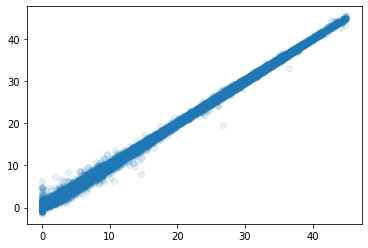

In [65]:
# Whole RMSE: 0.2055
plt.scatter(oof_df["speedMps"], oof_df["pred_speedMps"], alpha=0.1)

In [66]:
test["pred_speedMps"] = np.mean(preds, axis=0)
oof_df["collectionName"] = le_co.inverse_transform(oof_df["collectionName"])
test["collectionName"] = le_co.inverse_transform(test["collectionName"])

oof_df["phoneName"] = le_ph.inverse_transform(oof_df["phoneName"])
test["phoneName"] = le_ph.inverse_transform(test["phoneName"])

In [67]:
train_df = pd.read_csv(root_dir / "baseline_locations_train.csv")
train_df = train_df.merge(oof_df[["collectionName", "phoneName", "millisSinceGpsEpoch", "pred_speedMps"]], on=["collectionName", "phoneName", "millisSinceGpsEpoch"])
train_df

,collectionName,phoneName,millisSinceGpsEpoch,latDeg,lngDeg,heightAboveWgs84EllipsoidM,phone,pred_speedMps
0,2020-05-14-US-MTV-1,Pixel4,1273529463442,37.423575,-122.094091,-34.06,2020-05-14-US-MTV-1_Pixel4,0.170657
1,2020-05-14-US-MTV-1,Pixel4,1273529464442,37.423578,-122.094101,-33.29,2020-05-14-US-MTV-1_Pixel4,-0.090300
2,2020-05-14-US-MTV-1,Pixel4,1273529465442,37.423573,-122.094111,-30.99,2020-05-14-US-MTV-1_Pixel4,0.050574
3,2020-05-14-US-MTV-1,Pixel4,1273529466442,37.423583,-122.094121,-32.83,2020-05-14-US-MTV-1_Pixel4,-0.007225
4,2020-05-14-US-MTV-1,Pixel4,1273529467442,37.423579,-122.094114,-34.49,2020-05-14-US-MTV-1_Pixel4,0.051520
...,...,...,...,...,...,...,...,...
131337,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760315000,37.334460,-121.899600,-8.09,2021-04-29-US-SJC-2_SamsungS20Ultra,0.026518
131338,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760316000,37.334472,-121.899583,-7.59,2021-04-29-US-SJC-2_SamsungS20Ultra,0.050838
131339,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760317000,37.334491,-121.899597,-8.35,2021-04-29-US-SJC-2_SamsungS20Ultra,0.026707
131340,2021-04-29-US-SJC-2,SamsungS20Ultra,1303760318000,37.334495,-121.899583,-8.73,2021-04-29-US-SJC-2_SamsungS20Ultra,-0.069562


In [68]:
test_df = pd.read_csv(root_dir / "baseline_locations_test.csv")
test_df = test_df.merge(test[["collectionName", "phoneName", "millisSinceGpsEpoch", "pred_speedMps"]], on=["collectionName", "phoneName", "millisSinceGpsEpoch"])
test_df

,collectionName,phoneName,millisSinceGpsEpoch,latDeg,lngDeg,heightAboveWgs84EllipsoidM,phone,pred_speedMps
0,2020-05-15-US-MTV-1,Pixel4,1273608785432,37.416628,-122.082053,-30.69,2020-05-15-US-MTV-1_Pixel4,-0.000374
1,2020-05-15-US-MTV-1,Pixel4,1273608786432,37.416646,-122.082040,-31.76,2020-05-15-US-MTV-1_Pixel4,0.006241
2,2020-05-15-US-MTV-1,Pixel4,1273608787432,37.416652,-122.082039,-31.65,2020-05-15-US-MTV-1_Pixel4,0.015441
3,2020-05-15-US-MTV-1,Pixel4,1273608788432,37.416607,-122.082063,-31.52,2020-05-15-US-MTV-1_Pixel4,0.035798
4,2020-05-15-US-MTV-1,Pixel4,1273608789432,37.416609,-122.082073,-28.95,2020-05-15-US-MTV-1_Pixel4,-0.033386
...,...,...,...,...,...,...,...,...
91481,2021-04-29-US-SJC-3,SamsungS20Ultra,1303763185000,37.334539,-121.899383,-8.39,2021-04-29-US-SJC-3_SamsungS20Ultra,0.004456
91482,2021-04-29-US-SJC-3,SamsungS20Ultra,1303763186000,37.334545,-121.899380,-7.36,2021-04-29-US-SJC-3_SamsungS20Ultra,0.025227
91483,2021-04-29-US-SJC-3,SamsungS20Ultra,1303763187000,37.334551,-121.899371,-4.08,2021-04-29-US-SJC-3_SamsungS20Ultra,0.010388
91484,2021-04-29-US-SJC-3,SamsungS20Ultra,1303763188000,37.334540,-121.899371,-5.70,2021-04-29-US-SJC-3_SamsungS20Ultra,-0.103886


In [69]:
train_df.to_csv(root_dir / "baseline_locations_train_with_speed.csv", index=False)
test_df.to_csv(root_dir / "baseline_locations_test_with_speed.csv", index=False)